In [47]:
import os
import numpy as np
import matplotlib.pyplot as plt

from skimage.util import montage
from skimage.transform import rotate
import cv2

import nibabel as nib
from nilearn.image import load_img
from nilearn.plotting import plot_anat, plot_epi, plot_img, plot_roi
import nilearn.plotting as nlplt
import matplotlib.pyplot as plt

import tensorflow as tf
from tensorflow.keras import backend as K
from tensorflow.keras.models import Model
from tensorflow.keras import layers
from tensorflow.keras import models
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau
from tensorflow.keras.utils import Sequence
from sklearn.model_selection import train_test_split
from tensorflow.keras.losses import categorical_crossentropy

# Data Undertanding

In [48]:
# Path
TRAIN_PATH = 'E:/Jupyter Notebook/Lung Tumor/Datasets/imagesTraning'
LABEL_PATH = 'E:/Jupyter Notebook/Lung Tumor/Datasets/labelsTraning'
VAL_PATH = 'E:/Jupyter Notebook/Lung Tumor/Datasets/imagesValidation'

## => Data Dimension

In [49]:
imageSampel = os.path.join(TRAIN_PATH, 'lung_001.nii.gz')
maskSampel = os.path.join(LABEL_PATH, 'lung_001.nii.gz')
img = nib.load(imageSampel).get_fdata()
mask = nib.load(maskSampel).get_fdata()

print(f"Modality file: {imageSampel}")
print(f"Shape img (Z, X, Y): {img.shape}")
print(f"Resolution image: {img.shape[1]} x {img.shape[2]}\n")

print(f"Modality file: {maskSampel}")
print(f"Shape img (Z, X, Y): {mask.shape}")
print(f"Resolution image: {mask.shape[1]} x {mask.shape[2]}")

Modality file: E:/Jupyter Notebook/Lung Tumor/Datasets/imagesTraning\lung_001.nii.gz
Shape img (Z, X, Y): (512, 512, 304)
Resolution image: 512 x 304

Modality file: E:/Jupyter Notebook/Lung Tumor/Datasets/labelsTraning\lung_001.nii.gz
Shape img (Z, X, Y): (512, 512, 304)
Resolution image: 512 x 304


# Data Visual

## => Data Fill

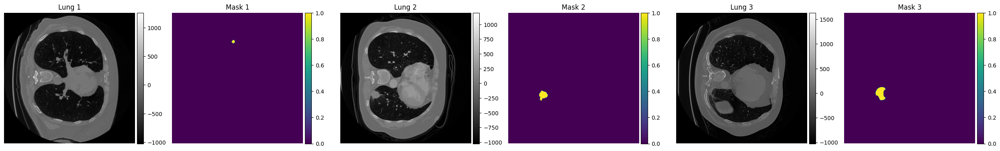

In [50]:
import os
import nibabel as nib
import matplotlib.pyplot as plt
import numpy as np
from mpl_toolkits.axes_grid1 import make_axes_locatable

TRAIN_PATH = r'E:/Jupyter Notebook/Lung Tumor/Datasets/imagesTraning'
LABEL_PATH = r'E:/Jupyter Notebook/Lung Tumor/Datasets/labelsTraning'

# Urutkan dan pilih 3 file berdasarkan indeks tertentu
all_images = sorted([f for f in os.listdir(TRAIN_PATH) if f.endswith('.nii.gz') and not f.startswith('._')])
all_masks  = sorted([f for f in os.listdir(LABEL_PATH) if f.endswith('.nii.gz') and not f.startswith('._')])
selected_idx = [62, 6, 17]  # misalnya file ke-9, 7, dan 18

image_files = [all_images[i] for i in selected_idx if i < len(all_images)]
mask_files  = [all_masks[i]  for i in selected_idx if i < len(all_masks)]

# Siapkan plot horizontal (1 baris, 6 kolom)
fig, axs = plt.subplots(1, len(image_files)*2, figsize=(25, 8))

for idx, (img_fname, msk_fname) in enumerate(zip(image_files, mask_files)):
    img = nib.load(os.path.join(TRAIN_PATH, img_fname)).get_fdata()
    msk = nib.load(os.path.join(LABEL_PATH, msk_fname)).get_fdata()
    sl = img.shape[2] // 2 - 25

    # Plot image
    ax_img = axs[2*idx]
    im0 = ax_img.imshow(img[:, :, sl], cmap='gray')
    ax_img.set_title(f'Lung {idx+1}', fontsize=12)
    ax_img.axis('off')

    # Tambah colorbar untuk image
    divider0 = make_axes_locatable(ax_img)
    cax0 = divider0.append_axes("right", size="5%", pad=0.05)
    fig.colorbar(im0, cax=cax0)

    # Plot mask
    ax_msk = axs[2*idx + 1]
    im1 = ax_msk.imshow(msk[:, :, sl], cmap='viridis')
    ax_msk.set_title(f'Mask {idx+1}', fontsize=12)
    ax_msk.axis('off')

    # Tambah colorbar untuk mask
    divider1 = make_axes_locatable(ax_msk)
    cax1 = divider1.append_axes("right", size="5%", pad=0.05)
    fig.colorbar(im1, cax=cax1)

plt.tight_layout()
plt.show()

## => 3D Volume Rendering

In [51]:
import nibabel as nib
import numpy as np
from skimage import measure
from scipy.ndimage import zoom
import plotly.graph_objects as go
import plotly.io as pio

# ✅ Gunakan renderer untuk Jupyter Notebook
pio.renderers.default = "notebook"  # Bisa diganti ke "iframe_connected" atau "colab" jika perlu

# 1. Load NIfTI file
print("Loading NIfTI file...")
lung_image_path = 'E:/Jupyter Notebook/Lung Tumor/Datasets/imagesTraning/lung_028.nii.gz'
data = nib.load(lung_image_path).get_fdata()

print(f"Original Data shape: {data.shape}")
print(f"Min intensity: {data.min()}, Max intensity: {data.max()}")

# 2. Resample (turunkan resolusi untuk efisiensi)
print("Resampling data...")
scale = 0.25
resampled_data = zoom(data, scale, order=1)
print(f"Resampled Data shape: {resampled_data.shape}")

# 3. Ekstraksi permukaan 3D
lung_threshold = -400  # Threshold HU untuk paru-paru
print("Extracting 3D surface using marching cubes...")
verts, faces, normals, values = measure.marching_cubes(resampled_data, level=lung_threshold)

# 4. Buat objek mesh 3D
print("Creating 3D mesh...")
x, y, z = verts.T
i, j, k = faces.T

mesh = go.Mesh3d(
    x=x, y=y, z=z,
    i=i, j=j, k=k,
    opacity=0.5,
    color='gray',
    name='Lung Surface'
)

# 5. Tampilkan langsung di Jupyter Notebook
fig = go.Figure(data=[mesh])
fig.update_layout(
    title="3D Lung Surface (Displayed in Notebook)",
    scene=dict(
        xaxis=dict(showbackground=False),
        yaxis=dict(showbackground=False),
        zaxis=dict(showbackground=False)
    ),
    showlegend=False
)

fig.show()

Loading NIfTI file...
Original Data shape: (512, 512, 251)
Min intensity: -1024.0, Max intensity: 3071.0
Resampling data...
Resampled Data shape: (128, 128, 63)
Extracting 3D surface using marching cubes...
Creating 3D mesh...


## => Nilear Visual

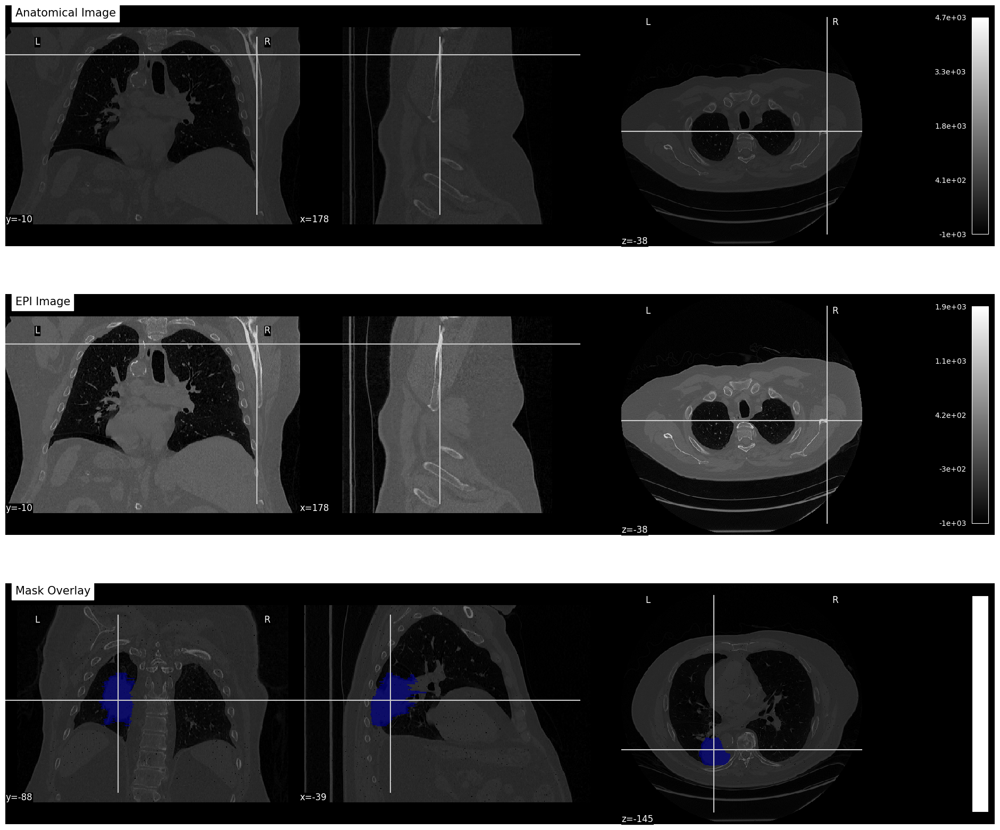

In [52]:
def plot_nilearn_views_with_mask(image_path, mask_path):
    niimg = load_img(image_path)
    nimask = load_img(mask_path)

    fig, axes = plt.subplots(3, 1, figsize=(24, 20))
    nlplt.plot_anat(niimg, title='Anatomical Image', axes=axes[0])
    nlplt.plot_epi(niimg, title='EPI Image', axes=axes[1])
    nlplt.plot_roi(nimask, bg_img=niimg, title='Mask Overlay', axes=axes[2])
    plt.show()
    
plot_nilearn_views_with_mask(
    os.path.join(TRAIN_PATH, 'lung_028.nii.gz'),
    os.path.join(LABEL_PATH, 'lung_028.nii.gz')
)

# Data Preprocessing

## => MinMaxScaler & Data Splitting

In [ ]:
from tensorflow.keras.utils import to_categorical
import nibabel as nib
import numpy as np
import os
from tqdm import tqdm
from scipy.ndimage import zoom

# Path Anda
TRAIN_PATH = 'E:/Jupyter Notebook/Lung Tumor/Datasets/imagesTraning'
LABEL_PATH = 'E:/Jupyter Notebook/Lung Tumor/Datasets/labelsTraning'
save_path_train = 'E:/Jupyter Notebook/Lung Tumor/Datasets/Preprocessed/train'
save_path_val = 'E:/Jupyter Notebook/Lung Tumor/Datasets/Preprocessed/val'

# Buat folder jika belum ada
os.makedirs(os.path.join(save_path_train, 'images'), exist_ok=True)
os.makedirs(os.path.join(save_path_train, 'mask'), exist_ok=True)
os.makedirs(os.path.join(save_path_val, 'images'), exist_ok=True)
os.makedirs(os.path.join(save_path_val, 'mask'), exist_ok=True)

# Fungsi untuk resize
def resize_volume(volume, target_shape=(128, 128, 128)):
    factors = [t / s for t, s in zip(target_shape, volume.shape)]
    return zoom(volume, zoom=factors, order=1)

# Ambil file .nii.gz
image_files = sorted([f for f in os.listdir(TRAIN_PATH) if f.endswith('.nii.gz')])
mask_files  = sorted([f for f in os.listdir(LABEL_PATH) if f.endswith('.nii.gz')])
assert len(image_files) == len(mask_files), "Jumlah gambar dan mask tidak sama!"

# Loop preprocessing
for i in tqdm(range(len(image_files)), desc="Preprocessing 3D data (resized to 128x128x128)"):
    img_path = os.path.join(TRAIN_PATH, image_files[i])
    mask_path = os.path.join(LABEL_PATH, mask_files[i])

    img = nib.load(img_path).get_fdata()
    mask = nib.load(mask_path).get_fdata()

    # Normalisasi
    img = (img - np.min(img)) / (np.max(img) - np.min(img) + 1e-8)
    img = img.astype(np.float32)

    # Mask biner
    mask = (mask > 0).astype(np.uint8)

    # Resize citra & mask
    img_resized = resize_volume(img, (128, 128, 128))
    mask_resized = resize_volume(mask, (128, 128, 128)).round().astype(np.uint8)

    # One-hot encode
    mask_onehot = to_categorical(mask_resized, num_classes=2)

    # Simpan file
    if i % 10 == 0:
        np.save(os.path.join(save_path_val, 'images', f'image_{i}.npy'), img_resized)
        np.save(os.path.join(save_path_val, 'mask', f'mask_{i}.npy'), mask_onehot)
    else:
        np.save(os.path.join(save_path_train, 'images', f'image_{i}.npy'), img_resized)
        np.save(os.path.join(save_path_train, 'mask', f'mask_{i}.npy'), mask_onehot)


## => Train Test Split Data 80% 20%

In [6]:
image_dataset = np.expand_dims(train_images / np.max(train_images), 3) # only the images need normalization
mask_dataset = np.expand_dims(train_masks, 3)

from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(image_dataset, mask_dataset, 
                                                    test_size = 0.20, random_state = 0)

## => 3D Residual Unet + InceptionV3 Block

In [8]:
def residual_block_3d(x, filters):
    shortcut = x

    # Samakan channel shortcut
    shortcut = Conv3D(filters, 1, padding='same')(shortcut)
    shortcut = BatchNormalization()(shortcut)

    x = Conv3D(filters, 3, padding='same')(x)
    x = BatchNormalization()(x)
    x = Activation('relu')(x)

    x = Conv3D(filters, 3, padding='same')(x)
    x = BatchNormalization()(x)

    x = Add()([shortcut, x])
    x = Activation('relu')(x)

    return x

In [13]:
def inception_block_3d(x, filters):
    f = max(filters // 8, 4)  # jaga jangan terlalu kecil

    b1 = Conv3D(f, 1, padding='same', activation='relu')(x)
    b2 = Conv3D(f, 3, padding='same', activation='relu')(x)

    b3 = MaxPooling3D(3, strides=1, padding='same')(x)
    b3 = Conv3D(f, 1, padding='same', activation='relu')(b3)

    x = Concatenate()([b1, b2, b3])
    x = Conv3D(filters, 1, padding='same', activation='relu')(x)
    return x

In [17]:
from tensorflow.keras.layers import MaxPooling3D

def encoder_block(x, filters):
    x = residual_block_3d(x, filters)
    x = inception_block_3d(x, filters)
    skip = x
    x = MaxPooling3D(pool_size=(2,2,2))(x)
    return x, skip

def decoder_block(x, skip, filters):
    x = UpSampling3D((2,2,2))(x)
    x = Concatenate()([x, skip])
    x = Conv3D(filters, 1, padding='same', activation='relu')(x)
    x = residual_block_3d(x, filters)
    return x

In [19]:
import tensorflow as tf
from tensorflow.keras.layers import (
    Input, Conv3D, MaxPooling3D, UpSampling3D,
    BatchNormalization, Activation, Add, Concatenate
)
from tensorflow.keras.models import Model

def ResUincep(
    input_shape=(128, 128, 64, 1),
    num_classes=1
):

    inputs = Input(input_shape)

    # 🔽 Encoder
    x, skip1 = encoder_block(inputs, 32)
    x, skip2 = encoder_block(x, 64)
    x, skip3 = encoder_block(x, 128)
    x, skip4 = encoder_block(x, 256)

    # 🔻 Bottleneck
    x = residual_block_3d(x, 512)
    x = inception_block_3d(x, 512)

    # 🔼 Decoder
    x = decoder_block(x, skip4, 256)
    x = decoder_block(x, skip3, 128)
    x = decoder_block(x, skip2, 64)
    x = decoder_block(x, skip1, 32)

    # 🎯 Output
    outputs = Conv3D(
        num_classes,
        kernel_size=1,
        activation='sigmoid'
    )(x)

    model = Model(inputs, outputs)
    return model

model = Residual_Inception_3D_UNet(
    input_shape=(128,128,64,1)
)

model.summary()

Model: "model_3"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_5 (InputLayer)           [(None, 128, 128, 6  0           []                               
                                4, 1)]                                                            
                                                                                                  
 conv3d_157 (Conv3D)            (None, 128, 128, 64  896         ['input_5[0][0]']                
                                , 32)                                                             
                                                                                                  
 batch_normalization_86 (BatchN  (None, 128, 128, 64  128        ['conv3d_157[0][0]']             
 ormalization)                  , 32)                                                       

## => Evaluation Function

In [ ]:
import tensorflow.keras.backend as K
from tensorflow.keras.losses import categorical_crossentropy

def dice_coefficient(y_true, y_pred, smooth=1e-5):
    y_true = K.cast(y_true, 'float32')
    y_pred = K.cast(y_pred, 'float32')
    intersection = K.sum(y_true * y_pred, axis=[1, 2, 3, 4])
    union = K.sum(y_true + y_pred, axis=[1, 2, 3, 4])
    dice = K.mean((2. * intersection + smooth) / (union + smooth), axis=0)
    return dice

def dice_loss(y_true, y_pred):
    y_true = K.cast(y_true, 'float32')
    y_pred = K.cast(y_pred, 'float32')
    return 1 - dice_coefficient(y_true, y_pred)

def categorical_dice_loss(y_true, y_pred):
    y_true = K.cast(y_true, 'float32')
    y_pred = K.cast(y_pred, 'float32')
    return categorical_crossentropy(y_true, y_pred) + dice_loss(y_true, y_pred)

def sensitivity(y_true, y_pred):
    y_true = K.cast(y_true, 'float32')
    y_pred = K.cast(y_pred, 'float32')
    true_positives = K.sum(K.round(K.clip(y_true * y_pred, 0, 1)), axis=[1, 2, 3, 4])
    possible_positives = K.sum(K.round(K.clip(y_true, 0, 1)), axis=[1, 2, 3, 4])
    return K.mean(true_positives / (possible_positives + K.epsilon()), axis=0)

def specificity(y_true, y_pred):
    y_true = K.cast(y_true, 'float32')
    y_pred = K.cast(y_pred, 'float32')
    true_negatives = K.sum(K.round(K.clip((1 - y_true) * (1 - y_pred), 0, 1)), axis=[1, 2, 3, 4])
    possible_negatives = K.sum(K.round(K.clip(1 - y_true, 0, 1)), axis=[1, 2, 3, 4])
    return K.mean(true_negatives / (possible_negatives + K.epsilon()), axis=0)

def precision_m(y_true, y_pred):
    y_true = K.cast(y_true, 'float32')
    y_pred = K.cast(y_pred, 'float32')
    true_positives = K.sum(K.round(K.clip(y_true * y_pred, 0, 1)), axis=[1, 2, 3, 4])
    predicted_positives = K.sum(K.round(K.clip(y_pred, 0, 1)), axis=[1, 2, 3, 4])
    precision = true_positives / (predicted_positives + K.epsilon())
    return K.mean(precision, axis=0)

def recall_m(y_true, y_pred):
    y_true = K.cast(y_true, 'float32')
    y_pred = K.cast(y_pred, 'float32')
    true_positives = K.sum(K.round(K.clip(y_true * y_pred, 0, 1)), axis=[1, 2, 3, 4])
    possible_positives = K.sum(K.round(K.clip(y_true, 0, 1)), axis=[1, 2, 3, 4])
    recall = true_positives / (possible_positives + K.epsilon())
    return K.mean(recall, axis=0)

def f1_m(y_true, y_pred):
    y_true = K.cast(y_true, 'float32')
    y_pred = K.cast(y_pred, 'float32')
    precision = precision_m(y_true, y_pred)
    recall = recall_m(y_true, y_pred)
    return 2 * ((precision * recall) / (precision + recall + K.epsilon()))
    
def rmse(y_true, y_pred):
    y_true = K.cast(y_true, 'float32')
    y_pred = K.cast(y_pred, 'float32')
    squared_error = tf.math.squared_difference(y_true, y_pred)
    return tf.sqrt(tf.reduce_mean(squared_error))

# Training Progress

## => Declared Paremeter

In [ ]:
import time
from tensorflow.keras.callbacks import Callback
from tensorflow.keras.callbacks import ModelCheckpoint, EarlyStopping, ReduceLROnPlateau

# Simpan model terbaik berdasarkan validation loss
checkpoint = ModelCheckpoint("best_model.keras", 
                             monitor='val_loss', 
                             verbose=1, 
                             save_best_only=True, 
                             mode='min')

# Hentikan training lebih awal jika tidak membaik
earlystop = EarlyStopping(monitor='val_loss', 
                          patience=5, 
                          verbose=1, 
                          restore_best_weights=True)

# Kurangi learning rate saat val_loss stagnan
reduce_lr = ReduceLROnPlateau(monitor='val_loss', 
                              factor=0.5, 
                              patience=3, 
                              verbose=1, 
                              min_lr=1e-4)

class TimeHistory(Callback):
    def on_train_begin(self, logs=None):
        self.epoch_times = []

    def on_epoch_begin(self, epoch, logs=None):
        self.start_time = time.time()

    def on_epoch_end(self, epoch, logs=None):
        duration = time.time() - self.start_time
        self.epoch_times.append(duration)
        print(f"Epoch {epoch + 1} waktu: {duration:.2f} detik")

# Inisialisasi callback
time_callback = TimeHistory()

# Gabungkan semua callback
callbacks = [checkpoint, earlystop, reduce_lr, time_callback]

## => Adam Optimizer Model Compile

In [ ]:
# Hitung steps per epoch untuk training dan validation
steps_per_epoch = len(train_img_list) // batch_size
val_steps_per_epoch = len(val_img_list) // batch_size

# Compile model dengan optimizer Adam dan loss + metrics yang sudah didefinisikan
model.compile(optimizer=Adam(learning_rate=1e-4),
              loss=categorical_dice_loss,
              metrics=[
                    "accuracy",
                    dice_coefficient,
                    sensitivity,
                    specificity,
                    precision_m,
                    recall_m,
                    f1_m,
                    rmse
                ])

## => Model Fit

In [ ]:
history_res = model.fit(
    train_gen,
    validation_data=val_gen,
    epochs=100,
    steps_per_epoch=steps_per_epoch,
    validation_steps=val_steps_per_epoch,
    callbacks=callbacks
)

# Evluation Model

## => Result Obtained Function Evaluation

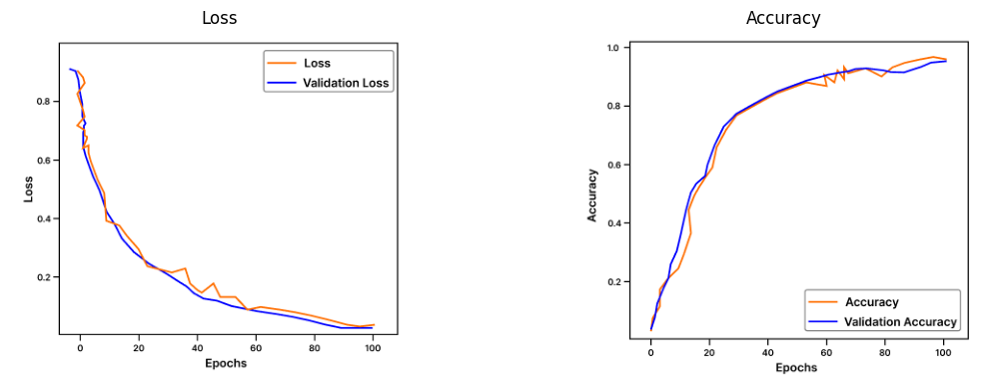

In [40]:
loss = history_res.history['loss'] 
val_loss = history_res.history['val_loss']

plt.grid()
plt.legend(['loss', 'val_loss'], loc = 'best')
plt.xlabel('epoch')
plt.ylabel('Loss')
plt.title('Loss')

accuracy = history_res.history['acuracy'] 
val_accuracy = history_res.history['val_accuracy']

plt.grid()
plt.legend(['acuracy', 'val_acuracy'], loc = 'best')
plt.xlabel('epoch')
plt.ylabel('Acuracy')
plt.title('Acuracy')

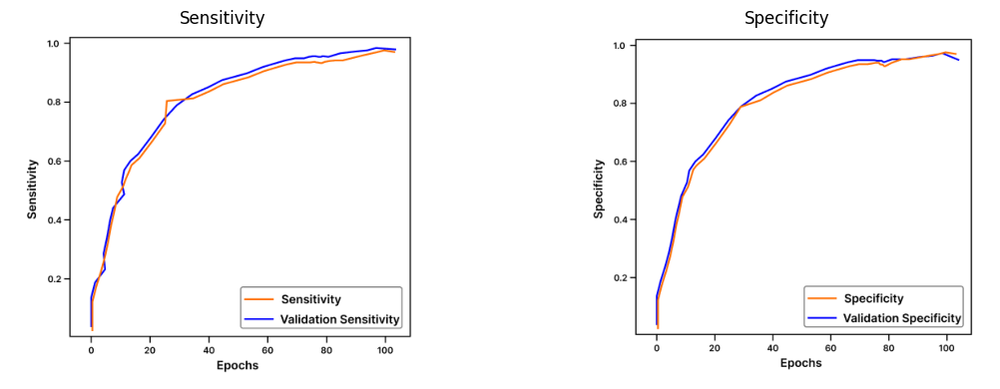

In [41]:
sensitifity = history_res.history['sensitifity'] 
val_sensitifity = history_res.history['val_sensitifity']

plt.grid()
plt.legend(['sensitifity', 'val_sensitifity'], loc = 'best')
plt.xlabel('epoch')
plt.ylabel('Sensitifity')
plt.title('Sensitifity')

specificity = history_res.history['specificity'] 
val_specificity = history_res.history['val_specificity']

plt.grid()
plt.legend(['Specificity', 'val_Specificity'], loc = 'best')
plt.xlabel('epoch')
plt.ylabel('Specificity')
plt.title('Specificity')

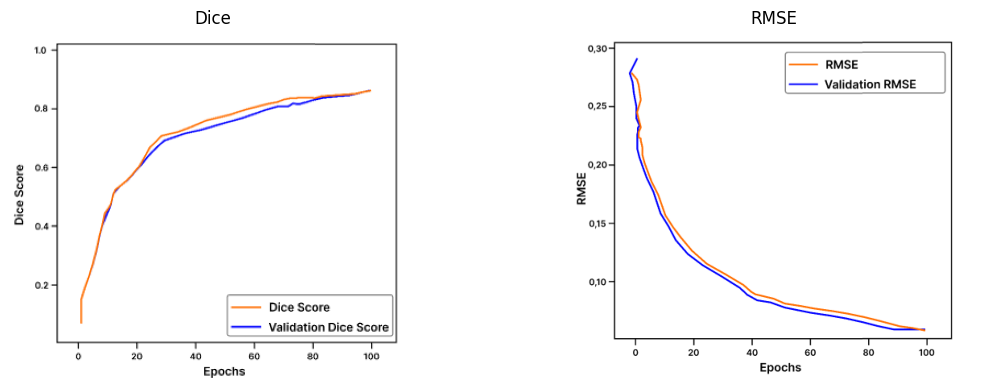

In [42]:
dice = history_res.history['dice'] 
val_dice = history_res.history['val_dice']

plt.grid()
plt.legend(['dice', 'val_dice'], loc = 'best')
plt.xlabel('epoch')
plt.ylabel('Dice Score')
plt.title('Dice')

rmse = history_res.history['rmse'] 
val_rmse = history_res.history['val_rmse']

plt.grid()
plt.legend(['rmse', 'val_rmse'], loc = 'best')
plt.xlabel('epoch')
plt.ylabel('RMSE')
plt.title('RMSE')

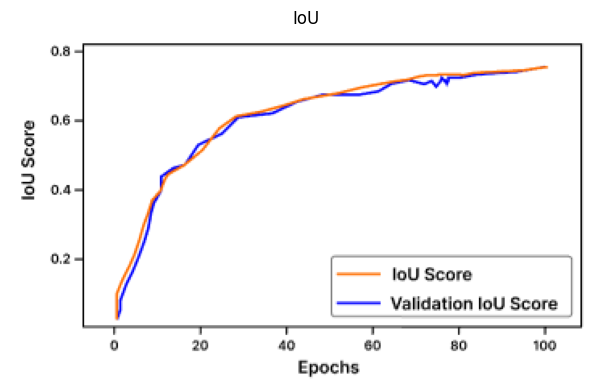

In [46]:
iou = history_res.history['iou'] 
val_iou = history_res.history['val_iou']

plt.grid()
plt.legend(['iou', 'val_iou'], loc = 'best')
plt.xlabel('epoch')
plt.ylabel('IoU Score')
plt.title('IoU')

## => Confusion Matrix, Clasification Report

==== Global Metrics ====
Accuracy: 0.9735
Precision: 0.9804
Recall (Sensitivity): 0.9006
Specificity: 0.9948
F1-Score: 0.9388
IoU: 0.8846

==== Classification Report ====
              Precision  Recall  F1-Score  Support
Class 0          0.9717  0.9948    0.9831  2243508
Class 1          0.9804  0.9006    0.9388   652794
Macro Avg        0.9761  0.9477    0.9609  2896302
Weighted Avg     0.9737  0.9735    0.9731  2896302


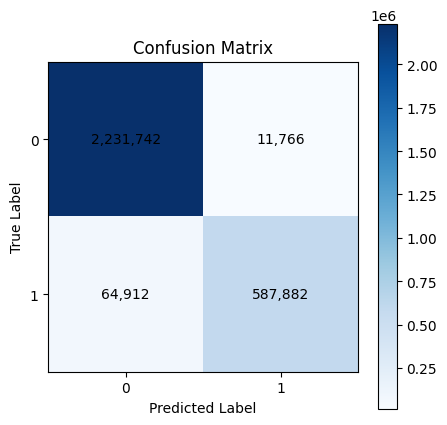

In [55]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd

# =========================
# 1️⃣ Definisikan Confusion Matrix
# =========================
cm = np.array()

# =========================
# 2️⃣ Hitung metrik global
# =========================
TN, FP = cm[0]
FN, TP = cm[1]

accuracy = (TP + TN) / cm.sum()
precision = TP / (TP + FP)
recall = TP / (TP + FN)
specificity = TN / (TN + FP)
f1_score = 2 * (precision * recall) / (precision + recall)
iou = TP / (TP + FP + FN)

print("==== Global Metrics ====")
print(f"Accuracy: {accuracy:.4f}")
print(f"Precision: {precision:.4f}")
print(f"Recall (Sensitivity): {recall:.4f}")
print(f"Specificity: {specificity:.4f}")
print(f"F1-Score: {f1_score:.4f}")
print(f"IoU: {iou:.4f}\n")

# =========================
# 3️⃣ Buat Classification Report dari CM
# =========================
# Kelas 0
precision_0 = TN / (TN + FN)
recall_0 = TN / (TN + FP)
f1_0 = 2 * (precision_0 * recall_0) / (precision_0 + recall_0)
support_0 = TN + FP

# Kelas 1
precision_1 = TP / (TP + FP)
recall_1 = TP / (TP + FN)
f1_1 = 2 * (precision_1 * recall_1) / (precision_1 + recall_1)
support_1 = TP + FN

# Buat DataFrame report
report = pd.DataFrame({
    "Precision": [precision_0, precision_1],
    "Recall": [recall_0, recall_1],
    "F1-Score": [f1_0, f1_1],
    "Support": [support_0, support_1]
}, index=["Class 0", "Class 1"])

# Tambahkan macro & weighted average
macro_avg = pd.DataFrame({
    "Precision": [(precision_0 + precision_1)/2],
    "Recall": [(recall_0 + recall_1)/2],
    "F1-Score": [(f1_0 + f1_1)/2],
    "Support": [support_0 + support_1]
}, index=["Macro Avg"])

weighted_avg = pd.DataFrame({
    "Precision": [(precision_0*support_0 + precision_1*support_1)/(support_0 + support_1)],
    "Recall": [(recall_0*support_0 + recall_1*support_1)/(support_0 + support_1)],
    "F1-Score": [(f1_0*support_0 + f1_1*support_1)/(support_0 + support_1)],
    "Support": [support_0 + support_1]
}, index=["Weighted Avg"])

report = pd.concat([report, macro_avg, weighted_avg])

pd.options.display.float_format = '{:.4f}'.format
print("==== Classification Report ====")
print(report)

# =========================
# 4️⃣ Visualisasi Confusion Matrix
# =========================
plt.figure(figsize=(5,5))
plt.imshow(cm, cmap=plt.cm.Blues)
plt.title("Confusion Matrix")
plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.xticks([0, 1], ["0", "1"])
plt.yticks([0, 1], ["0", "1"])

# Annotasi angka
for i in range(cm.shape[0]):
    for j in range(cm.shape[1]):
        plt.text(j, i, f"{cm[i,j]:,}", ha="center", va="center", color="black")

plt.colorbar()
plt.show()

## ==> Prediction Step

166/166 [==============================] - 16s 58ms/step


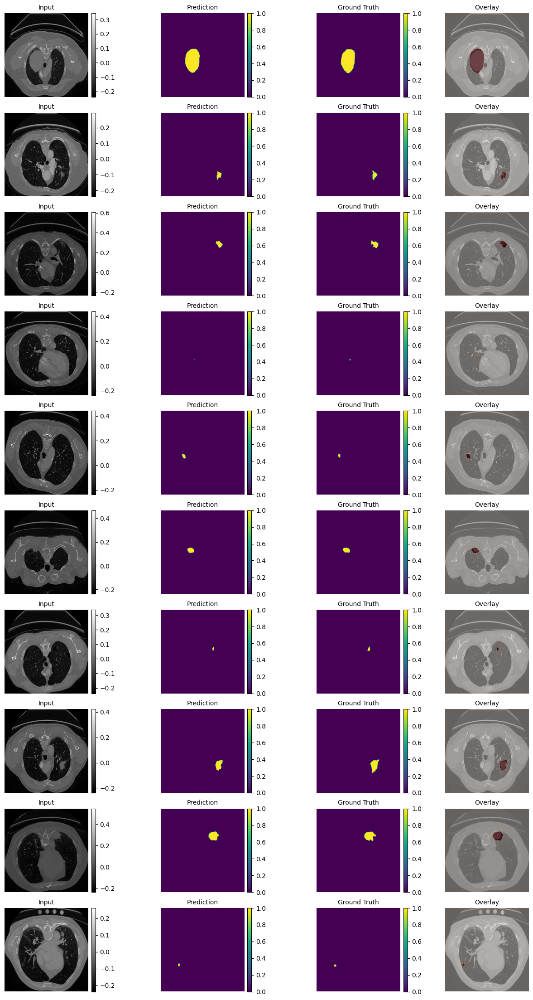

In [10]:
import matplotlib.pyplot as plt
import numpy as np

# Prediksi dari model (aman dari OOM)
y_pred = ResUincep.predict(X_test, batch_size=2)
y_pred_thresholded = y_pred > 0.5

# Jumlah gambar yang ingin ditampilkan
num_images = 10
num_images = min(num_images, len(X_test))

# SEKARANG 4 KOLOM
fig, axs = plt.subplots(num_images, 4, figsize=(14, num_images * 2.2))
plt.subplots_adjust(hspace=0.3, wspace=0.2)

for i in range(num_images):

    # =====================
    # 1. INPUT IMAGE
    # =====================
    im0 = axs[i, 0].imshow(X_test[i, :, :, 0], cmap='gray')
    axs[i, 0].set_title('Input', fontsize=10)
    axs[i, 0].axis('off')
    fig.colorbar(im0, ax=axs[i, 0], fraction=0.046, pad=0.02)

    # =====================
    # 2. PREDICTION
    # =====================
    im1 = axs[i, 1].imshow(y_pred_thresholded[i, :, :, 0], cmap='viridis')
    axs[i, 1].set_title('Prediction', fontsize=10)
    axs[i, 1].axis('off')
    fig.colorbar(im1, ax=axs[i, 1], fraction=0.046, pad=0.02)

    # =====================
    # 3. GROUND TRUTH
    # =====================
    im2 = axs[i, 2].imshow(y_test[i, :, :, 0], cmap='viridis')
    axs[i, 2].set_title('Ground Truth', fontsize=10)
    axs[i, 2].axis('off')
    fig.colorbar(im2, ax=axs[i, 2], fraction=0.046, pad=0.02)

    # =====================
    # 4. OVERLAY
    # =====================
    axs[i, 3].imshow(X_test[i, :, :, 0], cmap='gray')
    axs[i, 3].imshow(
        y_pred_thresholded[i, :, :, 0],
        cmap='Reds',
        alpha=0.4
    )
    axs[i, 3].set_title('Overlay', fontsize=10)
    axs[i, 3].axis('off')

plt.tight_layout(pad=0.5)
plt.show()